In [137]:
import requests
from PIL import Image
import torch
import numpy as np
import cv2
from geopy.geocoders import Nominatim
from transformers import Owlv2Processor, Owlv2ForObjectDetection
from transformers import OwlViTProcessor, OwlViTForObjectDetection

# objectProcessor = Owlv2Processor.from_pretrained("google/owlv2-base-patch16-ensemble")
# objectModel = Owlv2ForObjectDetection.from_pretrained("google/owlv2-base-patch16-ensemble")

objectProcessor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
objectModel = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

In [136]:
import pandas as pd
from pathlib import Path
seed = 3

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import numpy as np
# Specify the directory path


from PIL import Image, ExifTags
from PIL.ExifTags import TAGS

from IPython.display import display
# img = Image.open(f"mappilary/train_val/{place}/database/images/{df['key'][sample]}.jpg")
img = Image.open("./sampleImages/sign.jpeg")
           
# display(img)

import easyocr
reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory
def crop_image(image, x, y, w, h):
    """Crops an image using the provided coordinates.

    Args:
        image (Image): The PIL Image object to crop.
        x (int): The x-coordinate of the top-left corner of the crop region.
        y (int): The y-coordinate of the top-left corner of the crop region.
        w (int): The width of the crop region.
        h (int): The height of the crop region.

    Returns:
        Image: The cropped PIL Image object.
    """

    box = (x, y, x + w, y + h)  # Create the crop box tuple
    cropped_image = image.crop(box)
    return cropped_image



Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


In [138]:
from transformers import TrOCRProcessor, VisionEncoderDecoderModel

# load image from the IAM database (actually this model is meant to be used on printed text)
processor = TrOCRProcessor.from_pretrained('microsoft/trocr-base-printed')
model = VisionEncoderDecoderModel.from_pretrained('microsoft/trocr-base-printed')

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-printed and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [148]:
def run_text_extraction(x,y,w,h):
    textSeg = crop_image(img,x,y,w,h)
    pixel_values = processor(images=textSeg, return_tensors="pt").pixel_values
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    
    return generated_text


In [155]:
def run_text_extraction_hybrid(img, x,y,w,h):
    textSeg = crop_image(img,x,y,w,h)
    fig, ax = plt.subplots(figsize=(15, 10))
    res = reader.readtext(np.array(textSeg),  min_size=5, mag_ratio=2, text_threshold=0.5, low_text=0.3)

    for bbox, text, confidence in res:
        # Extract coordinates (assuming top-left is the origin)
        top_left = bbox[0]
        bottom_right = bbox[2]

        # Create a rectangle patch
        rect = mpatches.Rectangle(xy=top_left, 
                                  width=bottom_right[0] - top_left[0],
                                  height=bottom_right[1] - top_left[1],
                                  linewidth=1, edgecolor='r', facecolor='none')

        # Add the patch to the plot
        ax.add_patch(rect)

        # Add the text label near the bounding box
        bbox_image = crop_image(textSeg, top_left[0], top_left[1], bottom_right[0] - top_left[0], bottom_right[1] - top_left[1])
        pixel_values = processor(images=bbox_image, return_tensors="pt").pixel_values
        generated_ids = model.generate(pixel_values)
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
        ax.text(top_left[0], top_left[1], f'{generated_text} ({text}-{confidence:.2f})', 
                fontsize=10, bbox=dict(facecolor='white', alpha=0.7))
    ax.imshow(textSeg)  

    plt.show()
    return res


In [141]:
# run_text_extraction_hybrid(0,0,1600,1205)
from transformers import AutoImageProcessor, Mask2FormerForUniversalSegmentation

import torch

# Load Mask2Former trained on CityScapes panoptic segmentation dataset
seg_image_processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-mapillary-vistas-panoptic")
seg_model = Mask2FormerForUniversalSegmentation.from_pretrained(
    "facebook/mask2former-swin-large-mapillary-vistas-panoptic"
)

In [142]:
def run_segmentation(img):
    # Preprocess the image
    inputs = seg_image_processor(images=img, return_tensors="pt")

    # Perform inference
    with torch.no_grad():
        return seg_model(**inputs)




`label_ids_to_fuse` unset. No instance will be fused.
/var/tmp/pbs.9231082.pbs/ipykernel_3656602/801234173.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis =    matplotlib.cm.get_cmap('viridis', torch.max(segmentation) ) #cm.get_cmap('viridis', )


{'id': 1, 'label_id': 55, 'was_fused': False, 'score': 0.931343}
(0.278791, 0.062145, 0.386592, 1.0)
{'id': 2, 'label_id': 17, 'was_fused': False, 'score': 0.999944}
(0.283229, 0.120777, 0.440584, 1.0)
{'id': 3, 'label_id': 2, 'was_fused': False, 'score': 0.998773}
(0.278826, 0.17549, 0.483397, 1.0)
{'id': 4, 'label_id': 27, 'was_fused': False, 'score': 0.999914}
(0.267968, 0.223549, 0.512008, 1.0)
{'id': 5, 'label_id': 45, 'was_fused': False, 'score': 0.984885}
(0.250425, 0.27429, 0.533103, 1.0)
{'id': 6, 'label_id': 55, 'was_fused': False, 'score': 0.769573}
(0.229739, 0.322361, 0.545706, 1.0)
{'id': 7, 'label_id': 45, 'was_fused': False, 'score': 0.972565}
(0.210503, 0.363727, 0.552206, 1.0)
{'id': 8, 'label_id': 45, 'was_fused': False, 'score': 0.999084}
(0.190631, 0.407061, 0.556089, 1.0)
{'id': 9, 'label_id': 24, 'was_fused': False, 'score': 0.999163}
(0.172719, 0.448791, 0.557885, 1.0)
{'id': 10, 'label_id': 6, 'was_fused': False, 'score': 0.979299}
(0.157729, 0.485932, 0.558013

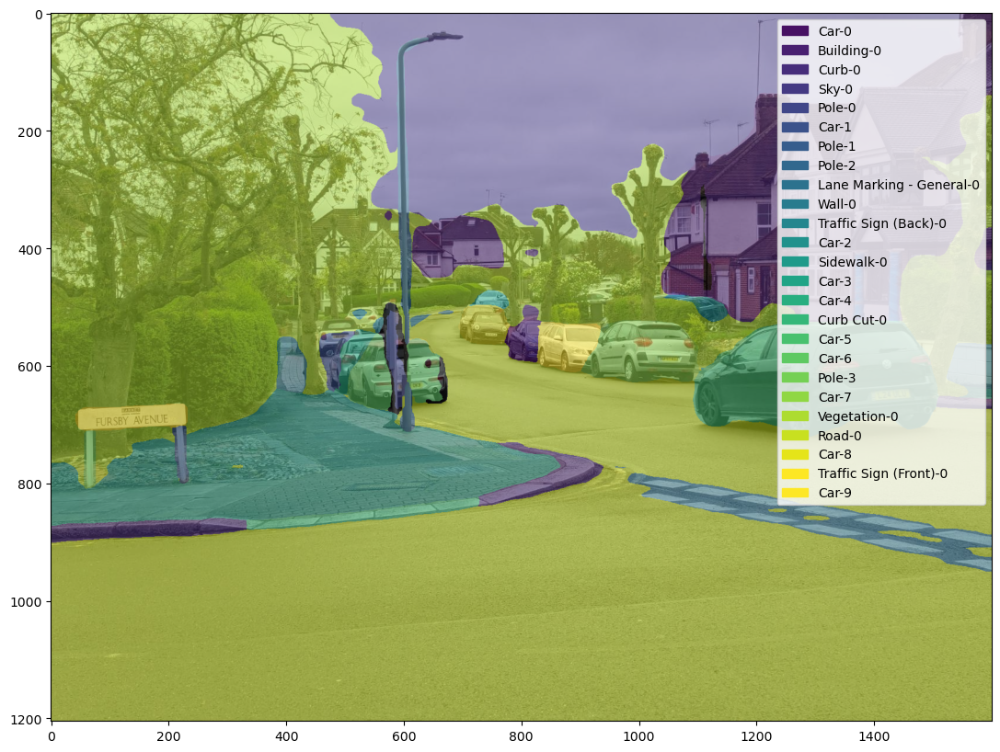

In [143]:


# # Load Mask2Former trained on CityScapes panoptic segmentation dataset
# seg_image_processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-cityscapes-panoptic")
# seg_model = Mask2FormerForUniversalSegmentation.from_pretrained(
#     "facebook/mask2former-swin-large-cityscapes-panoptic"
# )
seg_outputs =  run_segmentation(img)

# Model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = seg_outputs.class_queries_logits
masks_queries_logits = seg_outputs.masks_queries_logits


from collections import defaultdict

def draw_panoptic_segmentation(segmentation, segments_info):
    # get the used color map
 
    viridis =    matplotlib.cm.get_cmap('viridis', torch.max(segmentation) ) #cm.get_cmap('viridis', )
    fig, ax = plt.subplots(figsize=(15, 10))

#     palette = np.array(ade_palette())
    color_seg = np.zeros((segmentation.shape[0], segmentation.shape[1], 3)) # height, width, 3
    instances_counter = defaultdict(int)
    handles = []
    # for each segment, draw its legend
    for segment in segments_info:
        segment_id = segment['id']
        print(segment)
        segment_label_id = segment['label_id']
        segment_label = seg_model.config.id2label[segment_label_id]
        label = f"{segment_label}-{instances_counter[segment_label_id]}"
        instances_counter[segment_label_id] += 1
        color = viridis(segment_id)
        print(color)
        color_seg[np.array(segmentation) == segment_id, :] = np.array( [color[0], color[1], color[2]]) # color[0:-1]

        handles.append(mpatches.Patch(color=color, label=label))
    
    ax.imshow((np.array(img)/510 + np.array(color_seg) /2) )   
    ax.legend(handles=handles)
#     return fig
pred_panoptic_map = seg_image_processor.post_process_panoptic_segmentation(
    seg_outputs, target_sizes=[img.size[::-1]]
)[0]
draw_panoptic_segmentation(**pred_panoptic_map)

1 Car
2 Building
3 Curb
4 Sky
5 Pole
6 Car
7 Pole
8 Pole
9 Lane Marking - General
10 Wall
11 Traffic Sign (Back)
12 Car
13 Sidewalk
14 Car
15 Car
16 Curb Cut
17 Car
18 Car
19 Pole
20 Car
21 Vegetation
22 Road
23 Car
24 Traffic Sign (Front)
found
25 Car


/var/tmp/pbs.9231082.pbs/ipykernel_3656602/1651869797.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis =    matplotlib.cm.get_cmap('viridis', torch.max(segmentation) ) #cm.get_cmap('viridis', )


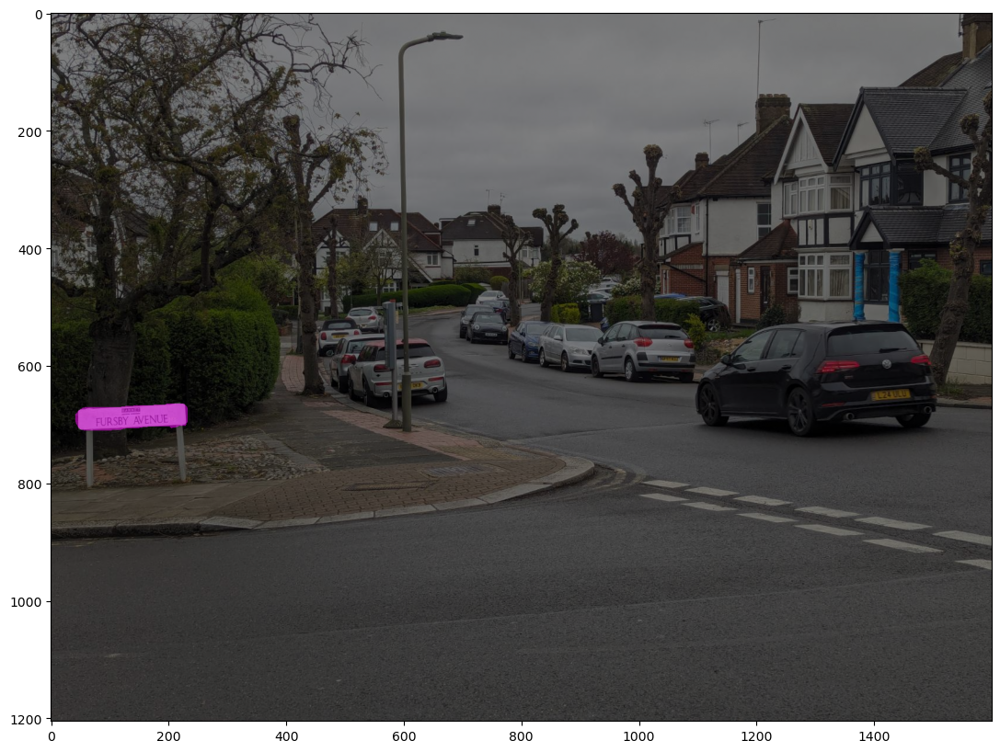

In [144]:
def show_segment(interest,segments_info,segmentation):
    for seg in segments_info:
        print(seg["id"], seg_model.config.id2label[seg["label_id"]])
        if seg_model.config.id2label[seg["label_id"]] == interest:
            print("found")
    viridis =    matplotlib.cm.get_cmap('viridis', torch.max(segmentation) ) #cm.get_cmap('viridis', )
    fig, ax = plt.subplots(figsize=(15, 10))

    color_seg = np.zeros((segmentation.shape[0], segmentation.shape[1], 3)) # height, width, 3
    instances_counter = defaultdict(int)
    handles = []
    # for each segment, draw its legend
    for segment in segments_info:
        if seg_model.config.id2label[segment["label_id"]] == interest:
            segment_id = segment['id']
            color_seg[np.array(segmentation) == segment_id, :] = np.array( [1,0,1]) # color[0:-1]

    ax.imshow((np.array(img)/510 + np.array(color_seg) /2) )   
show_segment("Traffic Sign (Front)",pred_panoptic_map["segments_info"],pred_panoptic_map["segmentation"])

In [145]:

geolocator = Nominatim(user_agent="Imperial College London")
mask = (pred_panoptic_map['segmentation'].numpy() == 24)
visual_mask = (mask * 255).astype(np.uint8)
# visual_mask = Image.fromarray(visual_mask)
# visual_mask
contours, hierarchy = cv2.findContours(visual_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)  
    text = run_text_extraction(x, y, w, h)
    location = geolocator.geocode(text)
    print(location.address)
    print((location.latitude, location.longitude))

/rds/general/user/ao921/home/anaconda3/envs/pytorch_env/lib/python3.11/site-packages/transformers/generation/utils.py:1178: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


NameError: name 'args' is not defined

In [ ]:
def run_object_detection(image, text):
    # image = crop_image(image, 0, 0, 1600, 1205)
    # Preprocess the image
    inputs = objectProcessor(text=[text],images=image, return_tensors="pt")

    # Perform inference
    outputs =  objectModel(**inputs)
    # Target image sizes (height, width) to rescale box predictions [batch_size, 2]
    target_sizes = torch.Tensor([image.size[::-1]])
    print(target_sizes)
    # Convert outputs (bounding boxes and class logits) to COCO API
    results = objectProcessor.post_process_object_detection(outputs=outputs, threshold=0.1,  target_sizes=target_sizes)

    i = 0  # Retrieve predictions for the first image for the corresponding text queries
    boxes, scores, labels = results[i]["boxes"], results[i]["scores"], results[i]["labels"]
    for box, score, label in zip(boxes, scores, labels):
        box = [round(i, 2) for i in box.tolist()]
        print(f"Detected {text[label]} with confidence {round(score.item(), 3)} at location {box}")
    return boxes, scores, labels


boxes, scores, labels = run_object_detection(img, "a photo of a traffic sign")






# Print detected objects and rescaled box coordinates



tensor([[1205., 1600.]])
Detected a with confidence 0.221 at location [44.0, 664.11, 228.02, 714.19]


In [ ]:
def display_detection_results(image, boxes, scores, labels):
    # Draw boxes on the image
    fig, ax = plt.subplots(figsize=(15, 10))
    imageHeight, imageWidth = image.size
    ax.imshow(image)
    for box, score, label in zip(boxes, scores, labels):
        # Extract coordinates (assuming top-left is the origin)
        x_min, y_min, x_max, y_max = box
        x_min, y_min, x_max, y_max =  int(x_min), int(y_min), int(x_max), int(y_max)
        print(x_min, y_min, x_max, y_max)
        # Create a rectangle patch
        rect = mpatches.Rectangle(xy=(x_min, y_min), width=x_max - x_min, height=y_max - y_min, linewidth=1, edgecolor='orchid', facecolor='none')

        # Add the patch to the plot
        ax.add_patch(rect)

        # Add the text label near the bounding box
        ax.text(x_min, y_min, f'({score:.2f})', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

    plt.show()

# display_detection_results(img, boxes, scores, labels)

25 30 166 162
369 38 512 161
212 123 285 182
238 186 381 308


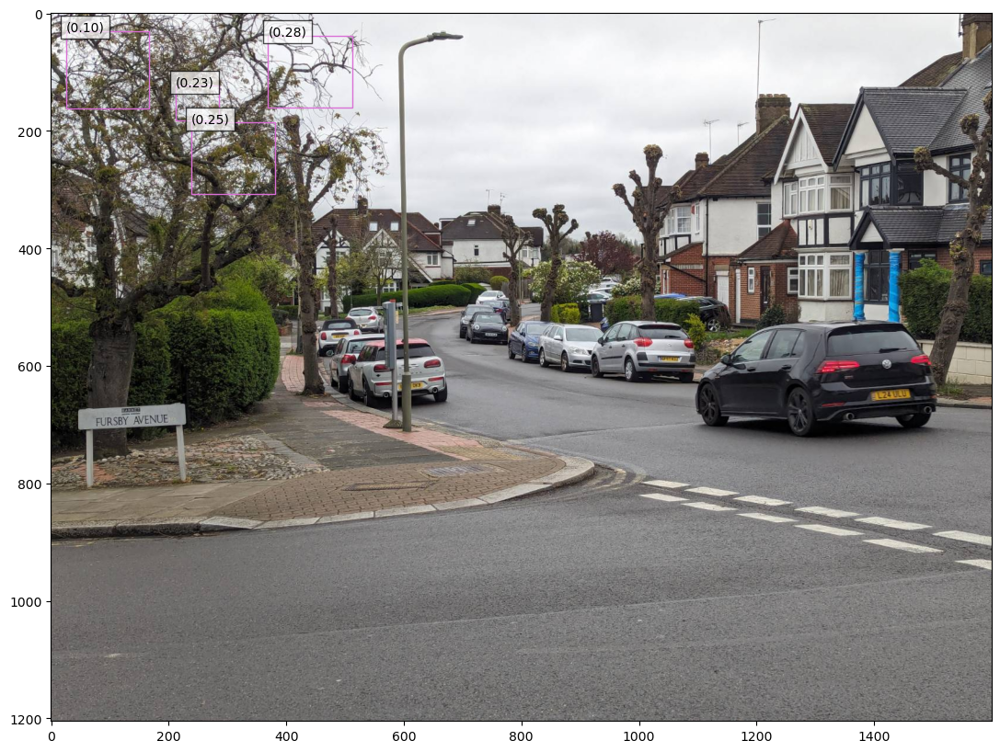

In [ ]:
display_detection_results(img, boxes, scores, labels)

tensor([[3072., 4080.]])
Detected a with confidence 0.18 at location [1562.73, 1278.74, 1673.53, 1395.23]
Detected a with confidence 0.141 at location [564.5, 1454.09, 792.96, 1565.13]
1562 1278 1673 1395
564 1454 792 1565


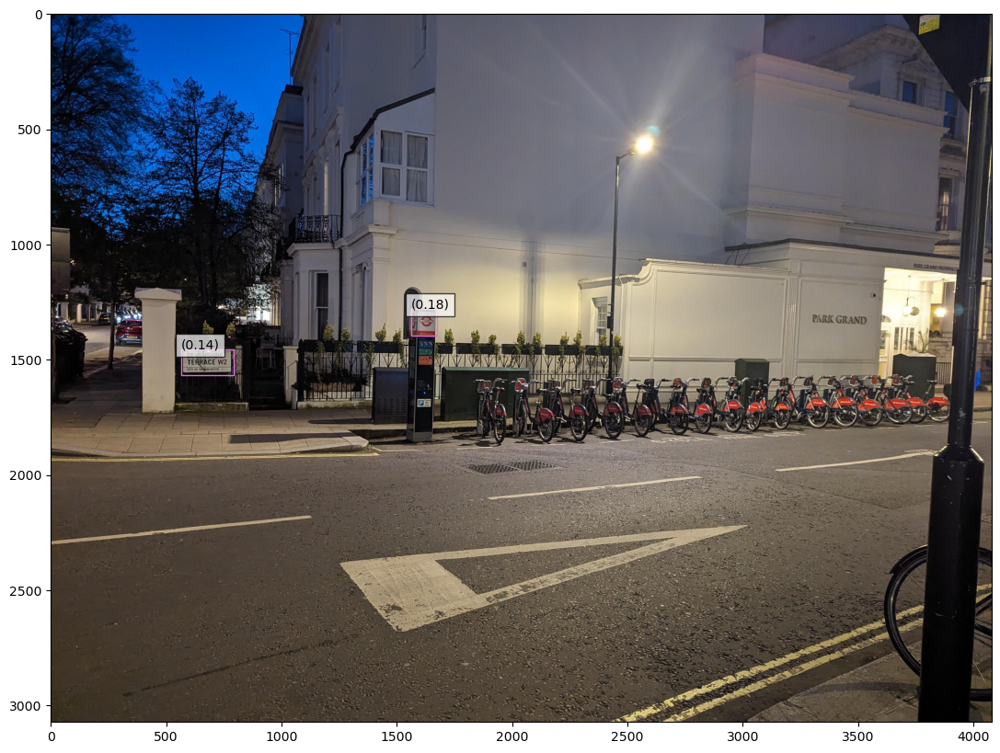

In [ ]:
demo_img = Image.open("sampleImages/sign2.jpeg")
boxes, scores, labels = run_object_detection(demo_img, "a sign" )
display_detection_results(demo_img, boxes, scores, labels)

tensor([[3072., 4080.]])
Detected a with confidence 0.133 at location [776.34, 1343.54, 1225.35, 1438.09]
776 1343 1225 1438


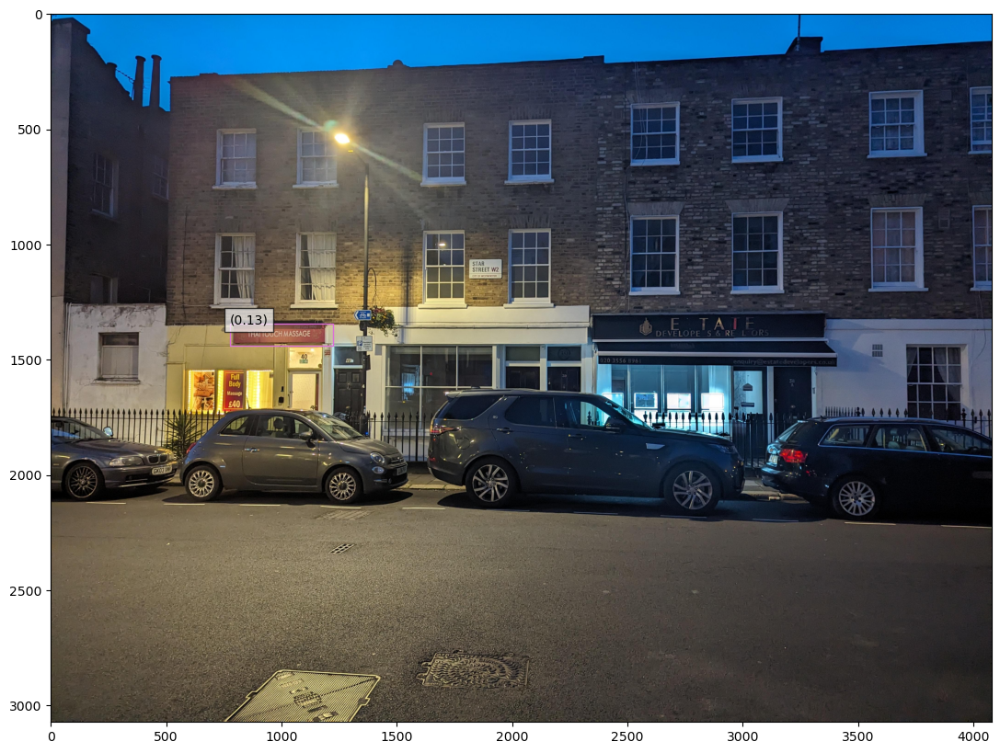

In [ ]:
demo_img = Image.open("sampleImages/sign3.jpeg")
boxes, scores, labels = run_object_detection(demo_img, "a sign" )
display_detection_results(demo_img, boxes, scores, labels)

tensor([[1205., 1600.]])
Detected a with confidence 0.159 at location [5.31, 585.64, 281.04, 754.35]
Detected a with confidence 0.13 at location [452.14, 659.26, 582.85, 725.32]
Detected a with confidence 0.157 at location [616.58, 620.13, 881.44, 740.18]
Detected a with confidence 0.123 at location [960.03, 559.19, 1411.22, 762.84]
Detected a with confidence 0.107 at location [1385.45, 651.73, 1478.66, 732.36]
5 585 281 754
452 659 582 725
616 620 881 740
960 559 1411 762
1385 651 1478 732


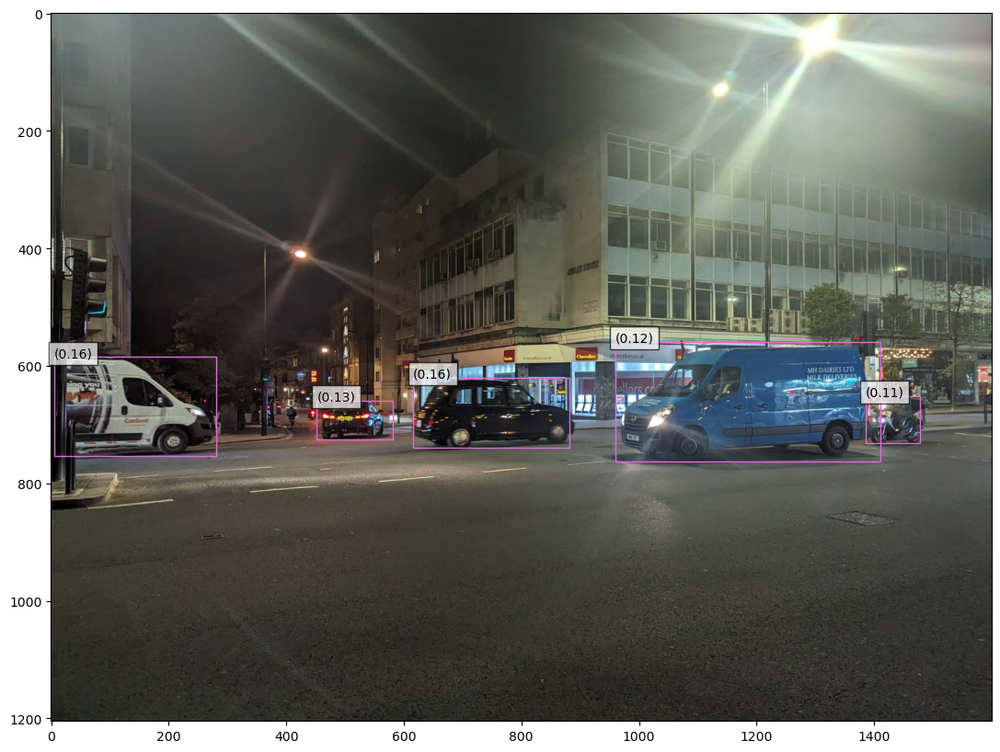

In [ ]:
demo_img = Image.open("sampleImages/sign4.jpeg")
boxes, scores, labels = run_object_detection(demo_img, "a vehicle" )
display_detection_results(demo_img, boxes, scores, labels)

tensor([[1205., 1600.]])
Detected a with confidence 0.108 at location [279.32, 268.72, 591.02, 362.62]
Detected a with confidence 0.113 at location [555.13, 393.0, 641.62, 444.36]
279 268 591 362


/rds/general/user/ao921/home/anaconda3/envs/pytorch_env/lib/python3.11/site-packages/transformers/generation/utils.py:1178: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


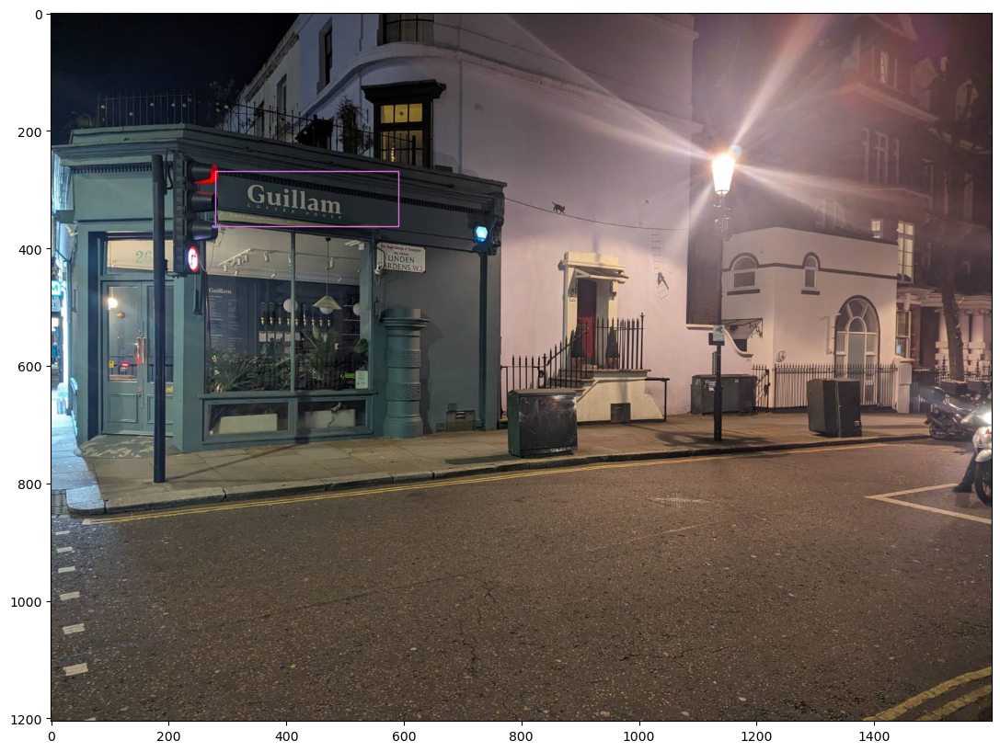

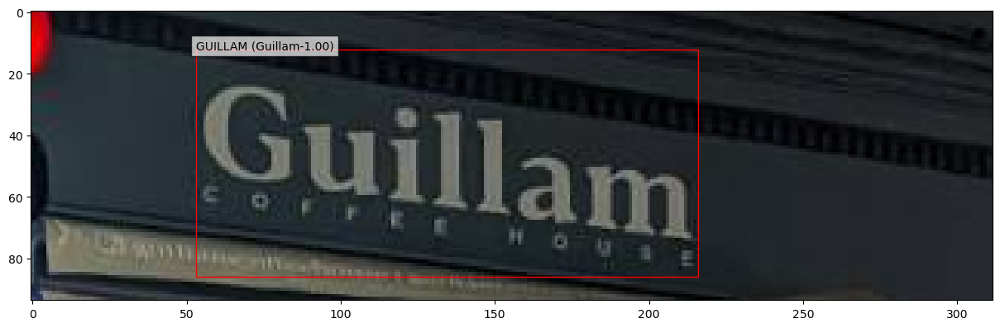

555 392 641 444


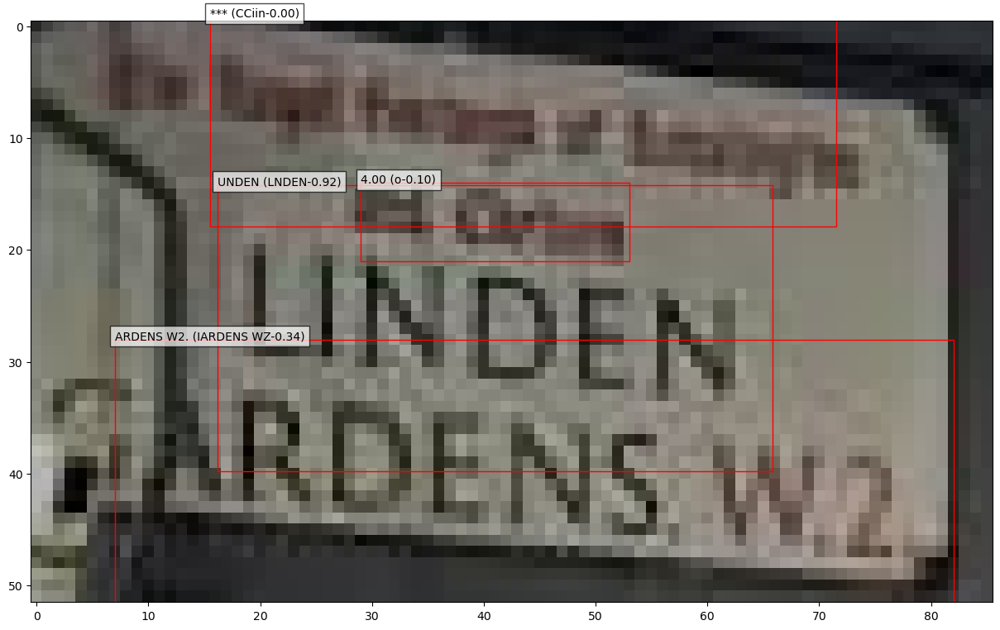

In [156]:
demo_img = Image.open("sampleImages/sign5.jpeg")
boxes, scores, labels = run_object_detection(demo_img, "a sign" )
display_detection_results_with_ocr(demo_img, boxes, scores, labels)

In [157]:
def display_detection_results_with_ocr(image, boxes, scores, labels):
    # Draw boxes on the image
    imageHeight, imageWidth = image.size
    for box, score, label in zip(boxes, scores, labels):
        # Extract coordinates (assuming top-left is the origin)
        x_min, y_min, x_max, y_max = box
        x_min, y_min, x_max, y_max =  int(x_min), int(y_min), int(x_max), int(y_max)
        print(x_min, y_min, x_max, y_max)
        # Create a rectangle patch

        # Add the patch to the plot

        # Read the text in the bounding box
        run_text_extraction_hybrid(image, x_min, y_min, x_max - x_min, y_max - y_min)
        # Add the text label near the bounding box



In [89]:
# import requests
# from PIL import Image
# from transformers import BlipProcessor, BlipForQuestionAnswering

# processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
# model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base").to("cuda")

# img_url = 'https://storage.googleapis.com/sfr-vision-language-research/BLIP/demo.jpg' 
# raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')

# question = "how many dogs are in the picture?"
# inputs = processor(raw_image, question, return_tensors="pt").to("cuda")

# out = model.generate(**inputs)
# print(processor.decode(out[0], skip_special_tokens=True))


import requests
from PIL import Image
from transformers import BlipProcessor, BlipForQuestionAnswering

processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base")


question = "how many triangles are in the picture?"
inputs = processor(demo_img, question, return_tensors="pt")

out = model.generate(**inputs)
print(processor.decode(out[0], skip_special_tokens=True))

4


In [159]:
geolocator = Nominatim(user_agent="Imperial College London")
geolocator.geocode("Guillam", exactly_one=False)

[Location(Chemin de la Maison Guillam, Libersart, Tourinnes-Saint-Lambert, Walhain, Nivelles, Brabant wallon, Wallonie, 1457, België / Belgique / Belgien, (50.6507186, 4.7227675, 0.0)),
 Location(Chemin de la Maison Guillam (Ch.23), Libersart, Tourinnes-Saint-Lambert, Walhain, Nivelles, Brabant wallon, Wallonie, 1457, België / Belgique / Belgien, (50.6518637, 4.7220204, 0.0)),
 Location(Guillam Coffee House, 31, St Petersburgh Place, Bayswater, London, Greater London, England, W2 4LA, United Kingdom, (51.5122091, -0.1911195, 0.0)),
 Location(Guillam Coffee House, 24, Gloucester Road, South Kensington, Royal Borough of Kensington and Chelsea, London, Greater London, England, SW7 4RB, United Kingdom, (51.4989893, -0.1838605, 0.0))]

In [98]:
import requests
from PIL import Image
import torch

from transformers import OwlViTProcessor, OwlViTForObjectDetection

processor = OwlViTProcessor.from_pretrained("google/owlvit-base-patch32")
model = OwlViTForObjectDetection.from_pretrained("google/owlvit-base-patch32")

texts = [["a photo of a traffic sign"]]
inputs = processor(text=texts, images=img, return_tensors="pt")
outputs = model(**inputs)

# Target image sizes (height, width) to rescale box predictions [batch_size, 2]
target_sizes = torch.Tensor([img.size[::-1]])
# Convert outputs (bounding boxes and class logits) to COCO API
results = processor.post_process_object_detection(outputs=outputs, threshold=0.1, target_sizes=target_sizes)

i = 0  # Retrieve predictions for the first image for the corresponding text queries
text = texts[i]
boxes, scores, labels = results[i]["boxes"], results[i]["scores"], results[i]["labels"]

# Print detected objects and rescaled box coordinates
for box, score, label in zip(boxes, scores, labels):
    box = [round(i, 2) for i in box.tolist()]
    print(f"Detected {text[label]} with confidence {round(score.item(), 3)} at location {box}")


Detected a photo of a traffic sign with confidence 0.221 at location [44.0, 664.11, 228.02, 714.19]


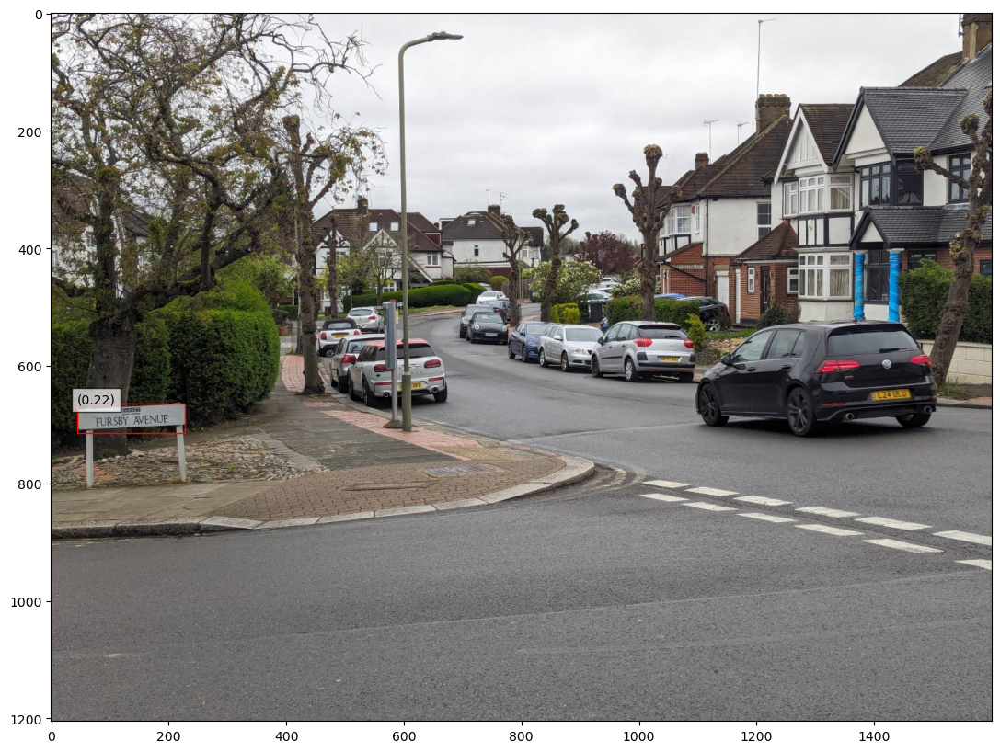

In [99]:
display_detection_results(img, [ [44.0, 664.11, 228.02, 714.19]], [0.221 ],  [["a photo of a traffic sign"]])
